In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"]= (10,2)
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
from sklearn.impute import KNNImputer
import sys
sys.path.append("D://NILM/code/")
from common import scatter, sliderPlot, create_features
from main import NILM

In [54]:
complete_data_lst = NILM()

data read done
transormation done


In [55]:
df1 = complete_data_lst[3]
print(len(df1))
df1.isna().sum()

4579201


f_A    535216
f_V    535216
f_C    535216
dtype: int64

In [28]:
df1.dropna(inplace=True)
len(df1)

4043985

2013-07-02 86400


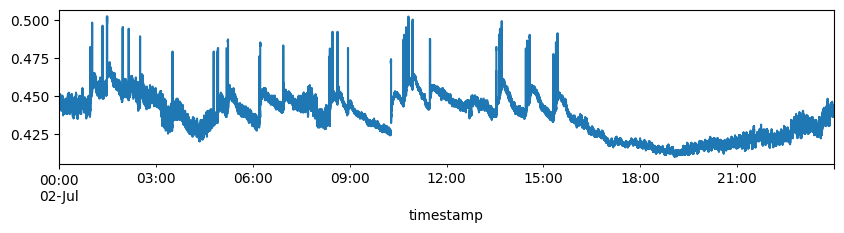

2013-07-29 86400


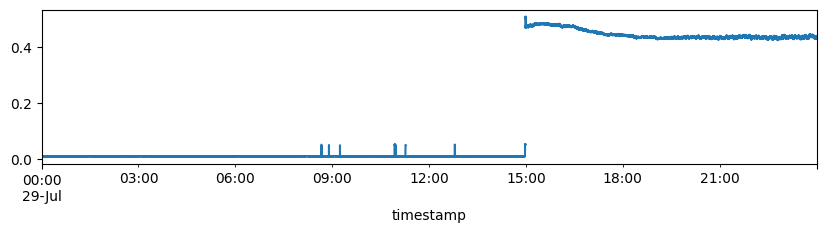

2013-07-30 86400


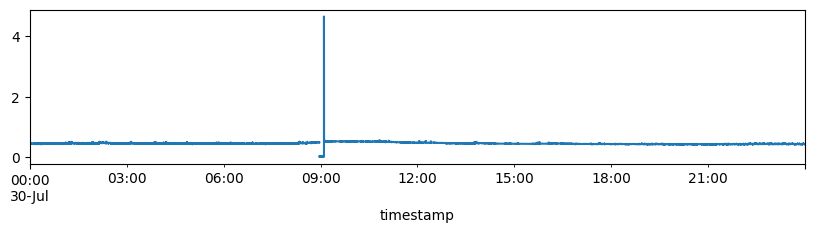

2013-07-31 86400


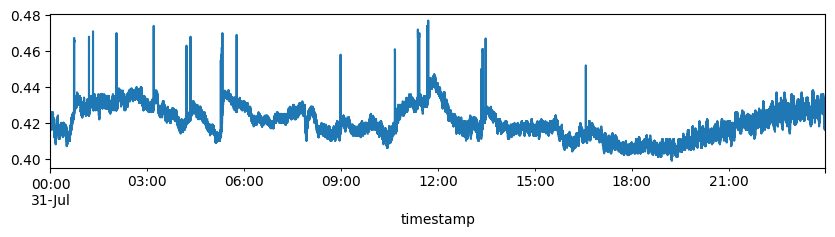

In [56]:
unique_dates = pd.Series(df1.index.date).unique()
l1 = []
for date1 in unique_dates:
    # print(date1)
    df_date = df1[df1.index.to_series().dt.date == date1]
    if len(df_date.dropna())>84000:
       l1.append(date1)
       print(date1,len(df_date))
       df_date['f_C'].plot()
       plt.show()


In [36]:
df1.loc["2013-07-29"]

,f_A,f_V,f_C
timestamp,,,
2013-07-29 00:00:00,0.19,239.17,0.011
2013-07-29 00:00:01,0.08,239.09,0.011
2013-07-29 00:00:02,0.12,239.21,0.011
2013-07-29 00:00:03,0.25,239.07,0.011
2013-07-29 00:00:04,0.17,239.14,0.011
...,...,...,...
2013-07-29 23:59:55,82.00,243.79,0.434
2013-07-29 23:59:56,82.15,243.69,0.435
2013-07-29 23:59:57,81.90,243.71,0.437


In [45]:
df1 = complete_data_lst[3]
print(len(df1))
df1.isna().sum()

4579201


f_A    535216
f_V    535216
f_C    535216
dtype: int64

<Axes: xlabel='timestamp'>

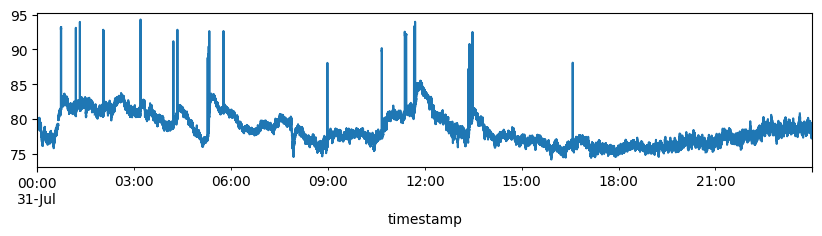

In [46]:
df1['f_A'].loc["2013-07-31"].plot()

In [34]:
unique_dates = pd.Series(df1.index.date).unique()
unique_dates

array([datetime.date(2013, 6, 12), datetime.date(2013, 6, 13),
       datetime.date(2013, 6, 14), datetime.date(2013, 6, 15),
       datetime.date(2013, 6, 16), datetime.date(2013, 6, 17),
       datetime.date(2013, 6, 18), datetime.date(2013, 6, 19),
       datetime.date(2013, 6, 20), datetime.date(2013, 6, 21),
       datetime.date(2013, 6, 22), datetime.date(2013, 6, 23),
       datetime.date(2013, 6, 24), datetime.date(2013, 6, 25),
       datetime.date(2013, 6, 26), datetime.date(2013, 6, 27),
       datetime.date(2013, 6, 28), datetime.date(2013, 6, 29),
       datetime.date(2013, 6, 30), datetime.date(2013, 7, 1),
       datetime.date(2013, 7, 2), datetime.date(2013, 7, 3),
       datetime.date(2013, 7, 4), datetime.date(2013, 7, 5),
       datetime.date(2013, 7, 6), datetime.date(2013, 7, 7),
       datetime.date(2013, 7, 8), datetime.date(2013, 7, 9),
       datetime.date(2013, 7, 10), datetime.date(2013, 7, 11),
       datetime.date(2013, 7, 12), datetime.date(2013, 7, 13),
 

In [33]:
dfd = df1[df1.index.to_series().dt.date == '2013-06-15']
dfd

,f_A,f_V,f_C
timestamp,,,


In [ ]:
import pandas as pd

# Assuming df is your DataFrame with a datetime index and a column 'value'
# Assuming 'datetime_column' is the name of your datetime column

# Sort the DataFrame by the datetime column
df = df.sort_values(by='datetime_column')

# Set the datetime column as the index
df.set_index('datetime_column', inplace=True)

# Assuming your data has a fixed seasonal period, for example, 24 hours in a day
seasonal_period = 24  # Adjust based on your data

# Function to perform Seasonal or Periodic Imputation
def seasonal_imputation(series, seasonal_period):
    imputed_series = series.copy()

    for i in range(seasonal_period, len(series)):
        if pd.isna(series.iloc[i]):
            # Find the corresponding value from the same period in the previous cycle
            previous_cycle_value = series.iloc[i - seasonal_period]
            imputed_series.iloc[i] = previous_cycle_value

    return imputed_series

# Apply Seasonal or Periodic Imputation to the 'value' column
df['value_imputed'] = seasonal_imputation(df['value'], seasonal_period)

# Reset the index if needed
df.reset_index(inplace=True)


In [49]:
df= df1.fillna(value=0)
print(len(df))
df.isna().sum()

4579201


f_A    0
f_V    0
f_C    0
dtype: int64

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

for column in df.columns:
    decomposition = seasonal_decompose(df[column], model='additive', period=2)  # Adjust period based on your data
    
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid
    df["trend"]= trend
    df["seasonal"]= seasonal
    df["residual"]= residual
    df['current'] = (residual.abs()+seasonal.abs()+trend.abs()).round(4)

In [19]:
df.isna().sum()

f_A            0
f_V            0
f_C            0
trend       3600
seasonal       0
residual    3600
current     3600
dtype: int64

<Axes: xlabel='timestamp'>

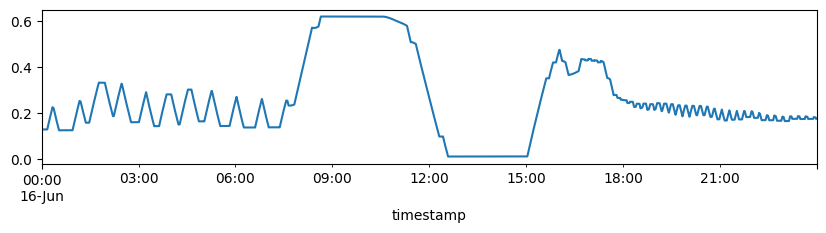

In [20]:
df['trend'].loc['2013-06-16'].plot()

<Axes: xlabel='timestamp'>

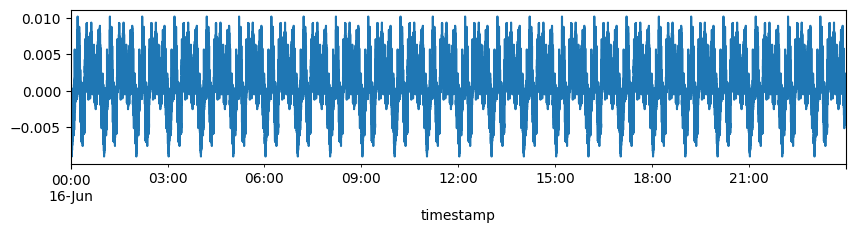

In [23]:
df['seasonal'].loc['2013-06-16'].plot()

<Axes: xlabel='timestamp'>

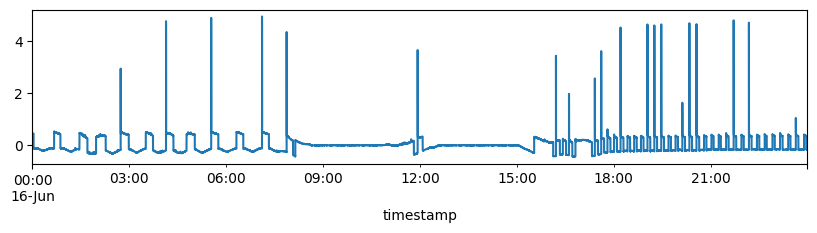

In [24]:
df['residual'].loc['2013-06-16'].plot()

In [69]:
df.dropna(inplace=True)

In [84]:
lf= df.loc['2013-06-16 09'].copy()

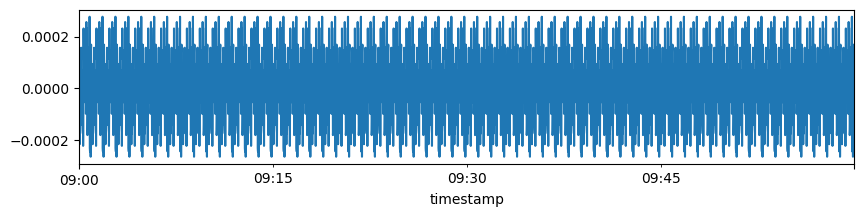

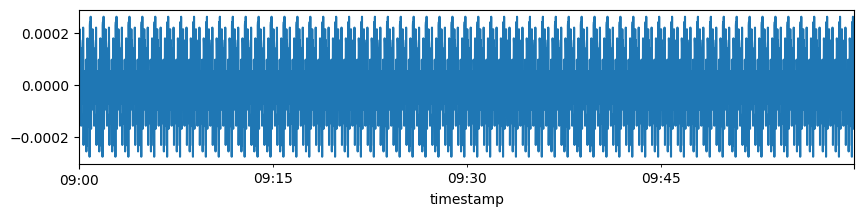

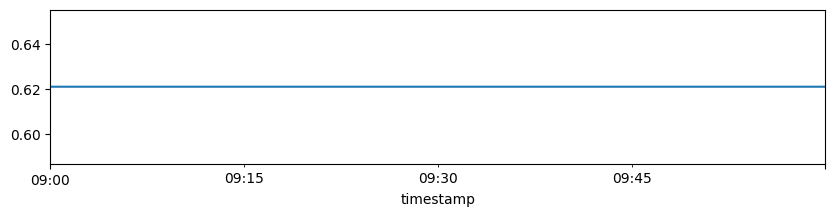

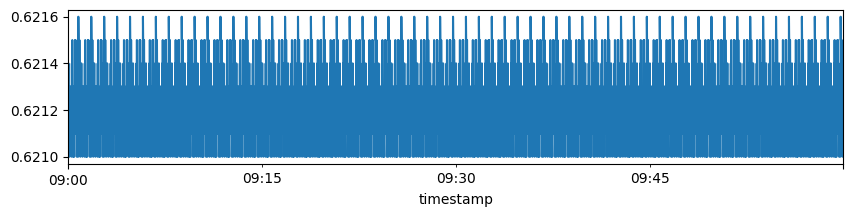

In [86]:
lf['residual'].plot()
plt.show()
lf['seasonal'].plot()
plt.show()
lf['trend'].plot()
plt.show()
lf['current'].plot()
plt.show()


In [51]:
sliderPlot(df1['f_C'].loc['2013-06-16'].copy(),t="line")
sliderPlot(df['f_C'].loc['2013-06-16'].copy(),t="line")
sliderPlot(df['current'].loc['2013-06-16'].copy(),t="line")

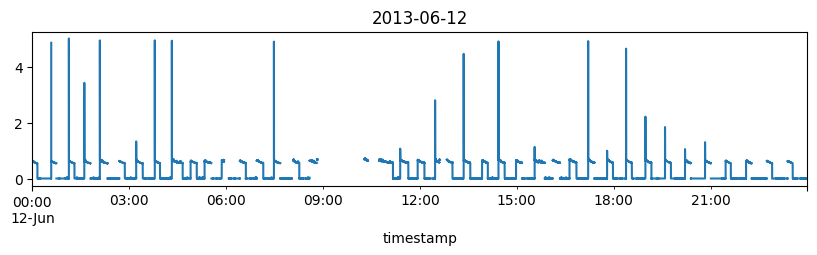

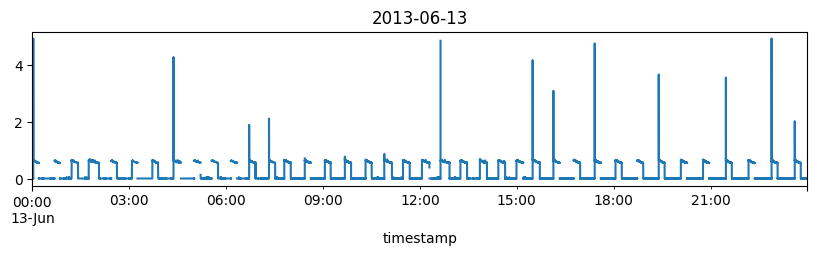

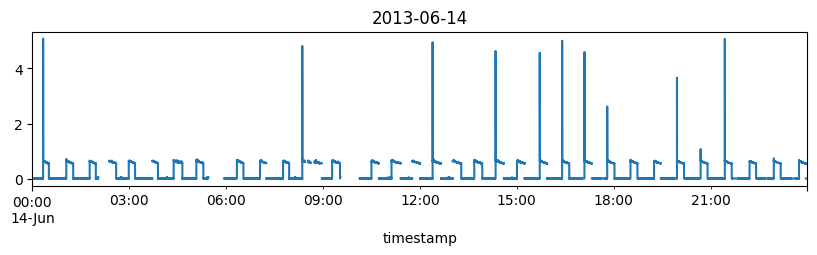

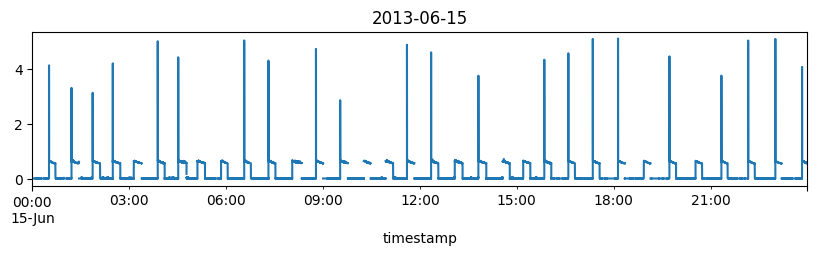

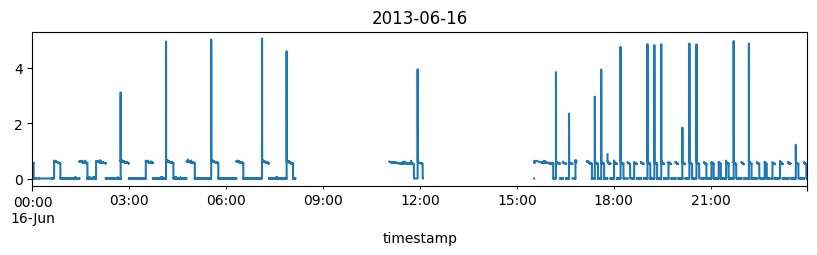

...

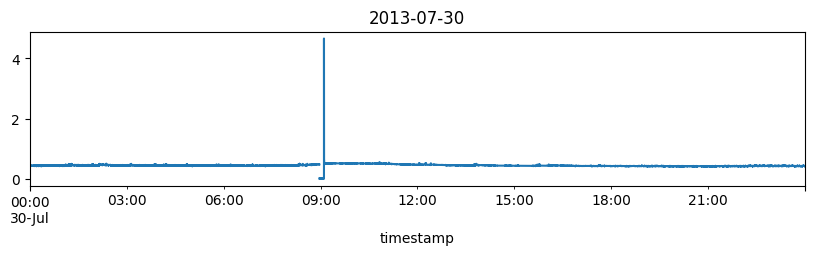

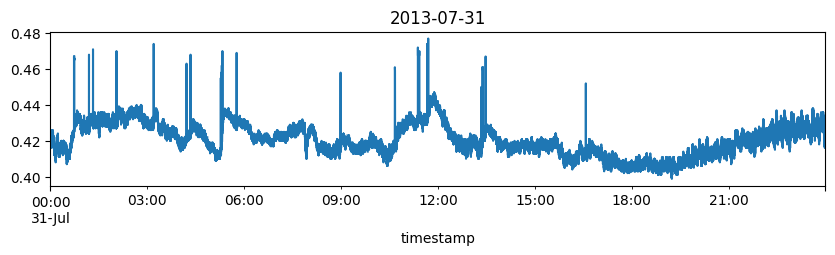

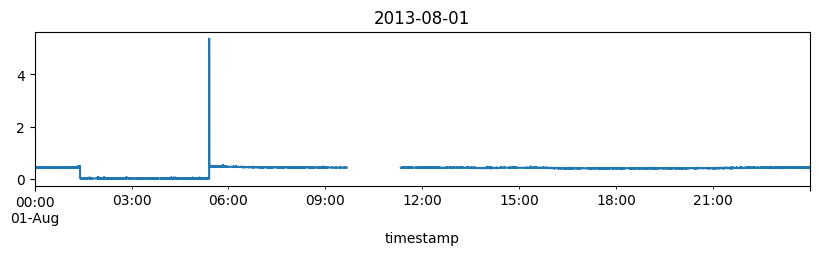

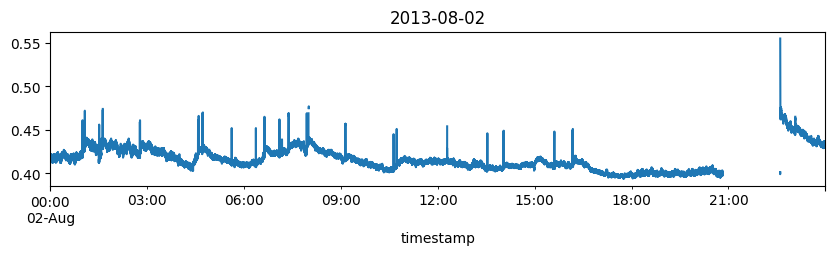

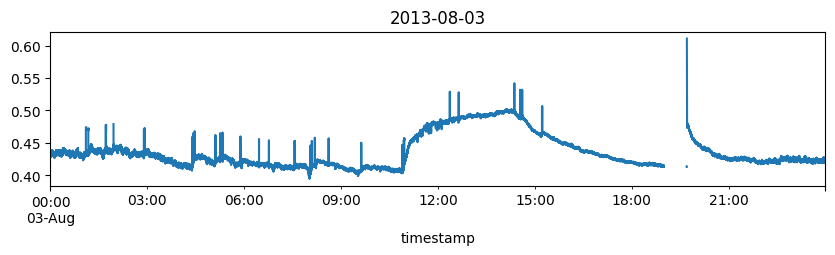

In [74]:
unique_dates = pd.Series(df.index.date).unique()
for date1 in unique_dates:
    # print(date1)
    df_date = df1[df1.index.to_series().dt.date == date1]
    df_date['f_C'].plot()
    plt.title(date1)
    plt.show()